# **Keras GAN Approach**

[Code Inspired by this Notebook]( https://www.kaggle.com/code/mrjustpeachy/gan-implementation#Model-Architecture)

## **Data collection and preprocessing**

In [ ]:
import pandas as pd
import numpy as np

remember to upload kaggle token as kaggle.json!!

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c gan-getting-started

gan-getting-started.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip gan-getting-started.zip

Streaming output truncated to the last 5000 lines.
  inflating: photo_jpg/46e84039a1.jpg  
  inflating: photo_jpg/46f391abec.jpg  
  inflating: photo_jpg/46f5ef1042.jpg  
  inflating: photo_jpg/4706619607.jpg  
  inflating: photo_jpg/4707b03a08.jpg  
  inflating: photo_jpg/47100a9939.jpg  
  inflating: photo_jpg/471f4755b9.jpg  
  inflating: photo_jpg/472b351bc4.jpg  
  inflating: photo_jpg/472d5ac100.jpg  
  inflating: photo_jpg/4758e5dd4c.jpg  
  inflating: photo_jpg/4762bb79ef.jpg  
  inflating: photo_jpg/4778b13518.jpg  
  inflating: photo_jpg/4787b82d37.jpg  
  inflating: photo_jpg/478e07feaa.jpg  
  inflating: photo_jpg/478eb12a82.jpg  
  inflating: photo_jpg/479698b371.jpg  
  inflating: photo_jpg/4796d67f61.jpg  
  inflating: photo_jpg/47aad493bd.jpg  
  inflating: photo_jpg/47ae0edd23.jpg  
  inflating: photo_jpg/47b94957ff.jpg  
  inflating: photo_jpg/47bb43fe3e.jpg  
  inflating: photo_jpg/47bb59d449.jpg  
  inflating: photo_jpg/47d391d94b.jpg  
  inflating: photo_jpg/47df26

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, BatchNormalization, Reshape, Flatten, Input, Conv2D, Conv2DTranspose, UpSampling2D, Dropout, Activation, Concatenate
from tensorflow.keras.backend import clear_session
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
from tensorflow.keras import backend as K

monet_paintings_path = '/content/monet_jpg'
monet_tfrec_path = '/content/monet_tfrec'
photos_path = '/content/photo_jpg'
photos_tfrec_path = '/content/photo_tfrec'

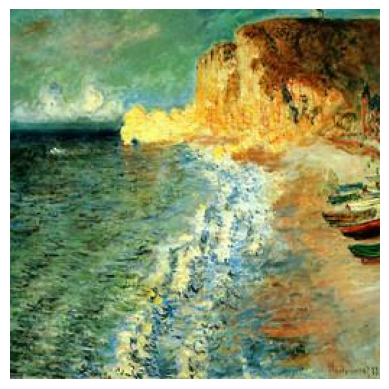

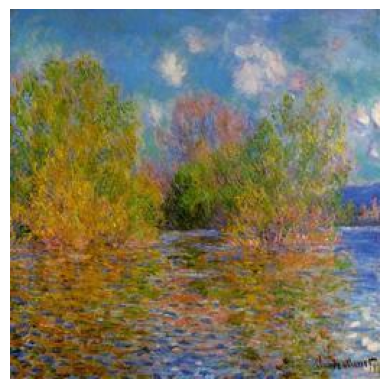

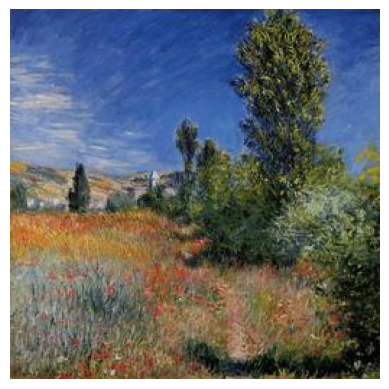

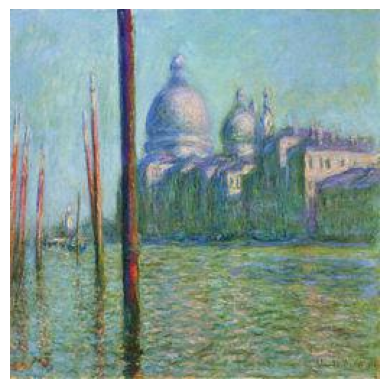

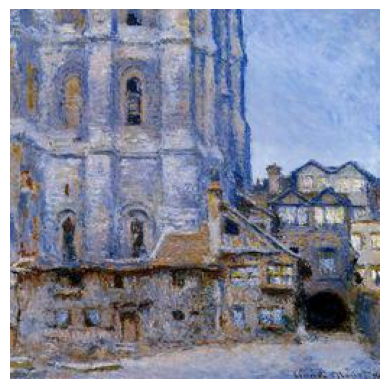

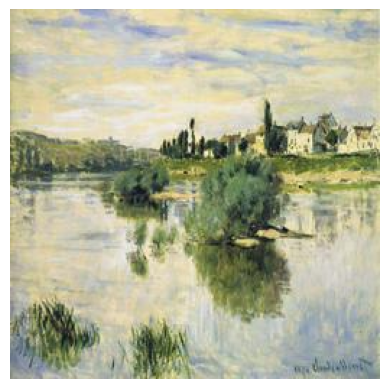

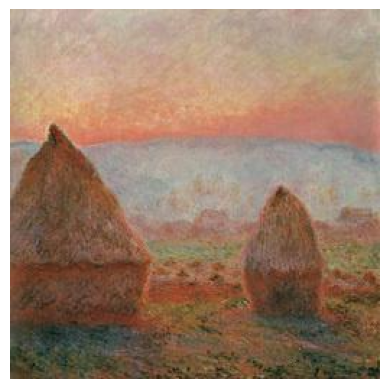

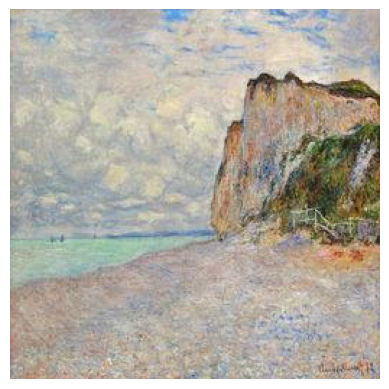

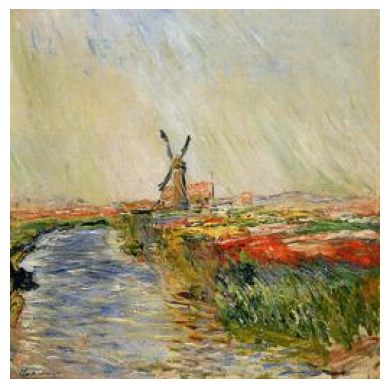

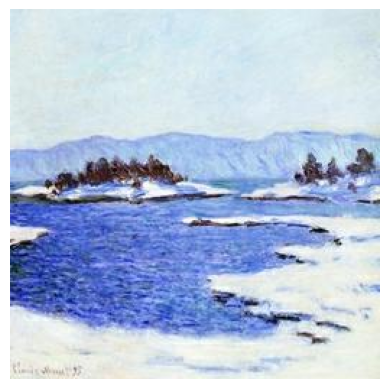

In [ ]:
# prompt: show photos in the monet_jpg folder

import matplotlib.pyplot as plt
import os

image_folder = '/content/monet_jpg'  # Replace with the actual path
image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))]

for image_path in image_files[:10]:
    try:
        img = plt.imread(image_path)
        plt.imshow(img)
        plt.axis('off')  # Hide axis ticks and labels
        plt.show()
    except Exception as e:
        print(f"Error displaying image {image_path}: {e}")


In [ ]:
monet_files = [f for f in os.listdir(monet_paintings_path) if f.lower().endswith(('jpg'))]
print("Monet Paintings len: " + str(len(monet_files)))

if monet_files:
    monet_first_image_path = os.path.join(monet_paintings_path, monet_files[0])
    try:
        with Image.open(monet_first_image_path) as img:
            print("Monet image details: " + monet_files[0] + ", Size: " + str(img.size))
    except Exception as e:
        print("Error processing file " + monet_files[0] + ": " + str(e))

# Photos dir info
photos_files = [f for f in os.listdir(photos_path) if f.lower().endswith(('jpg'))]
print("Photos len: " + str(len(photos_files)))

if photos_files:
    photos_first_image_path = os.path.join(photos_path, photos_files[0])
    try:
        with Image.open(photos_first_image_path) as img:
            print("photos image details: " + photos_files[0] + ", Size: " + str(img.size))
    except Exception as e:
        print("Error processing file " + photos_files[0] + ": " + str(e))

Monet Paintings len: 300
Monet image details: c2576267d4.jpg, Size: (256, 256)
Photos len: 7038
photos image details: 3fe71e2f91.jpg, Size: (256, 256)


In [ ]:
MONET_FILENAMES = [os.path.join(monet_tfrec_path, f) for f in os.listdir(monet_tfrec_path)]
print('Monet TFRecord Files:', len(MONET_FILENAMES))
print(MONET_FILENAMES)

PHOTO_FILENAMES = [os.path.join(photos_tfrec_path, f) for f in os.listdir(photos_tfrec_path)]
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))

Monet TFRecord Files: 5
['/content/monet_tfrec/monet04-60.tfrec', '/content/monet_tfrec/monet16-60.tfrec', '/content/monet_tfrec/monet00-60.tfrec', '/content/monet_tfrec/monet12-60.tfrec', '/content/monet_tfrec/monet08-60.tfrec']
Photo TFRecord Files: 20


In [ ]:
image_dimensions = [256, 256] # width, height
AUTOTUNE = tf.data.experimental.AUTOTUNE

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*image_dimensions, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset.prefetch(AUTOTUNE)

monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(4).prefetch(AUTOTUNE)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(4).prefetch(AUTOTUNE)

print(monet_ds)
print(photo_ds)

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>


In [ ]:
# Generator
# Input layer
generator_input = Input(shape=(256, 256, 3))

# Downsample
g1 = Conv2D(64, 3, strides=2, padding='same')(generator_input)
g1 = LeakyReLU()(g1)

g2 = Conv2D(128, 3, strides=2, padding='same')(g1)
g2 = BatchNormalization()(g2)
g2 = LeakyReLU()(g2)

g3 = Conv2D(256, 3, strides=2, padding='same')(g2)
g3 = BatchNormalization()(g3)
g3 = LeakyReLU()(g3)

# Upsample
g4 = Conv2DTranspose(128, 3, strides=2, padding='same')(g3)
g4 = BatchNormalization()(g4)
g4 = LeakyReLU()(g4)
g4 = Concatenate()([g4, g2])

g5 = Conv2DTranspose(64, 3, strides=2, padding='same')(g4)
g5 = BatchNormalization()(g5)
g5 = LeakyReLU()(g5)
g5 = Concatenate()([g5, g1])

# Output layer
generator_output = Conv2DTranspose(3, 3, strides=2, padding='same', activation='tanh')(g5)

# Define the model
generator_model = Model(generator_input, generator_output)
generator_model.summary()


# Discriminator
# Input layer
discriminator_input = Input(shape=(256, 256, 3))

# Convolutional layers
d1 = Conv2D(64, 3, strides=2, padding='same')(discriminator_input)
d1 = LeakyReLU()(d1)
d1 = Dropout(0.3)(d1)

d2 = Conv2D(128, 3, strides=2, padding='same')(d1)
d2 = LeakyReLU()(d2)
d2 = Dropout(0.3)(d2)

d3 = Conv2D(256, 3, strides=2, padding='same')(d2)
d3 = LeakyReLU()(d3)
d3 = Dropout(0.3)(d3)

# Flatten and output layer
d4 = Flatten()(d3)
discriminator_output = Dense(1, activation='sigmoid')(d4)

# Define the model
discriminator_model = Model(discriminator_input, discriminator_output)

discriminator_model.summary()

# Compile the discriminator model
discriminator_model.compile(loss='binary_crossentropy', optimizer=Adam(0.001, 0.5), metrics=['accuracy'])

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 128, 128, 64)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 64, 128)    │         73,856 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 64, 64, 128)    │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 256)    │        295,168 │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 32, 32, 256)    │          1,024 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 32, 32, 256)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose          │ (None, 64, 64, 128)    │        295,040 │ leaky_re_lu_2[0][0]    │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 128)    │            512 │ conv2d_transpose[0][0] │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 64, 64, 256)    │              0 │ leaky_re_lu_3[0][0],   │
│                           │                        │                │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_1        │ (None, 128, 128, 64)   │        147,520 │ concatenate[0][0]      │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 64)   │            256 │ conv2d_transpose_1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 128, 128, 64)   │              0 │ batch_normalization_3… │
├──────────────────────

 Total params: 819,139 (3.12 MB)

 Trainable params: 817,987 (3.12 MB)

 Non-trainable params: 1,152 (4.50 KB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_7 (LeakyReLU)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 262144)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │         262,145 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 632,961 (2.41 MB)

 Trainable params: 632,961 (2.41 MB)

 Non-trainable params: 0 (0.00 B)

Step 1/18, Epoch 1/25 - Discriminator Loss: 0.8107163906097412, Accuracy: 0.0% - Generator Loss: 0.8318707942962646, Accuracy: 0.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


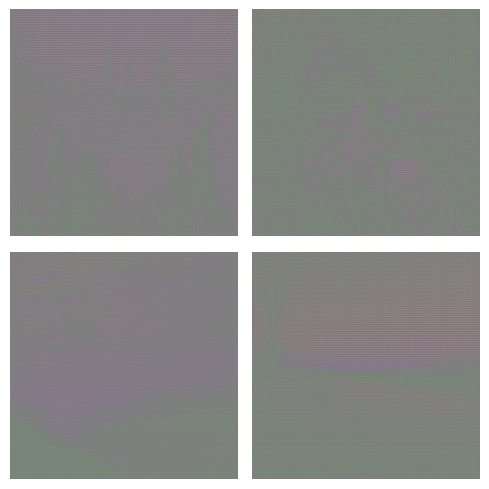

Step 1/18, Epoch 2/25 - Discriminator Loss: 1.171553373336792, Accuracy: 74.66% - Generator Loss: 1.1559326648712158, Accuracy: 75.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


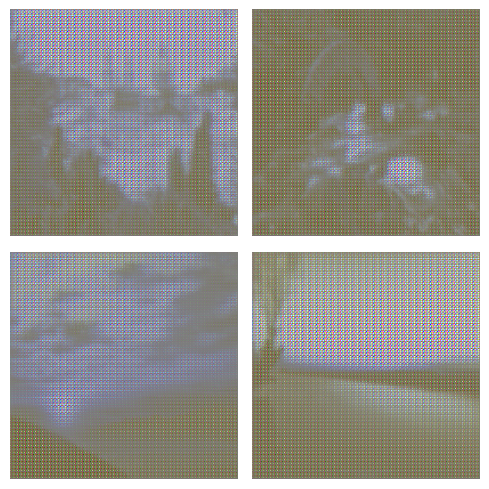

Step 1/18, Epoch 3/25 - Discriminator Loss: 1.576407551765442, Accuracy: 76.19% - Generator Loss: 1.5662143230438232, Accuracy: 76.35%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


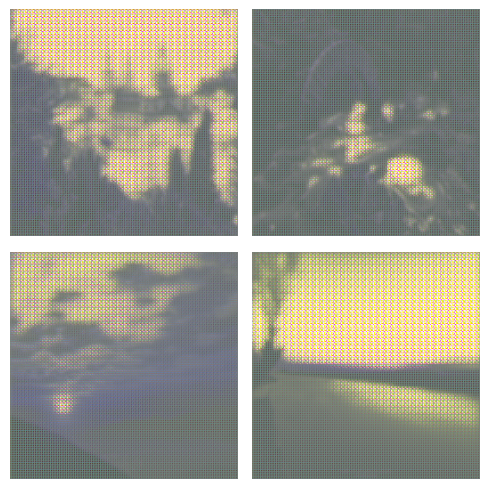

Step 1/18, Epoch 4/25 - Discriminator Loss: 1.254309892654419, Accuracy: 77.97% - Generator Loss: 1.2495360374450684, Accuracy: 77.95%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


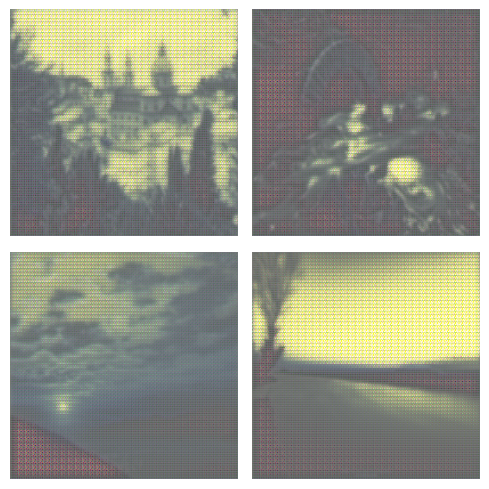

Step 1/18, Epoch 5/25 - Discriminator Loss: 1.031969666481018, Accuracy: 79.12% - Generator Loss: 1.0300803184509277, Accuracy: 79.11%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


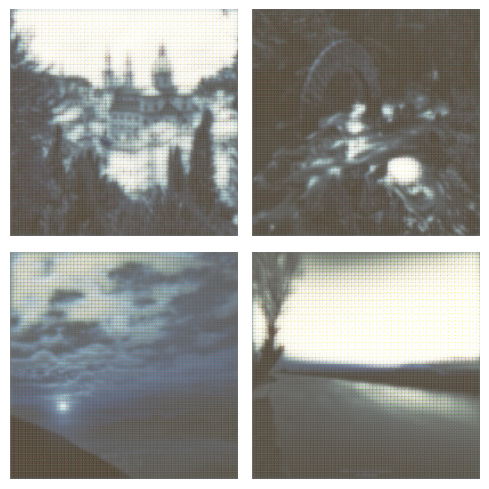

Step 1/18, Epoch 6/25 - Discriminator Loss: 0.9415539503097534, Accuracy: 80.17% - Generator Loss: 0.9390801191329956, Accuracy: 80.22%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


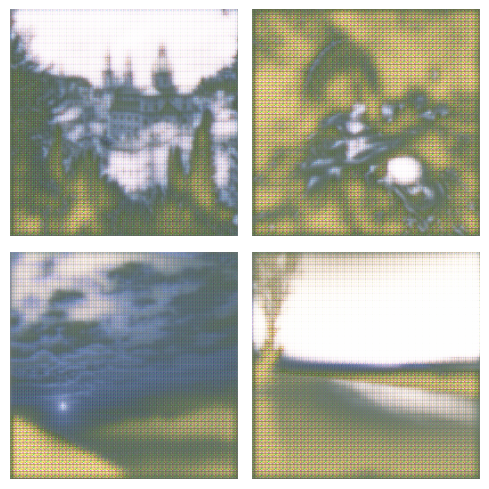

Step 1/18, Epoch 7/25 - Discriminator Loss: 0.9154009819030762, Accuracy: 79.66% - Generator Loss: 0.9138038754463196, Accuracy: 79.7%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


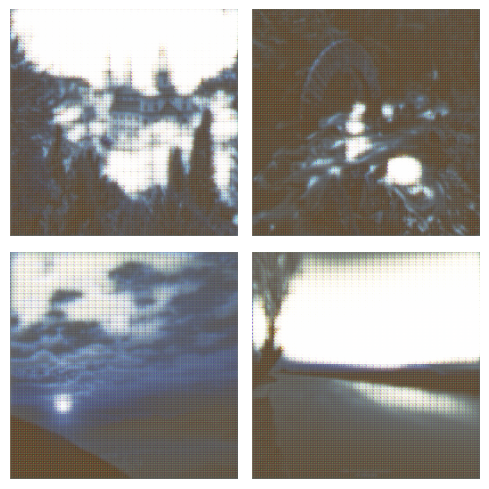

Step 1/18, Epoch 8/25 - Discriminator Loss: 0.8489083051681519, Accuracy: 79.78% - Generator Loss: 0.8473865389823914, Accuracy: 79.82%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


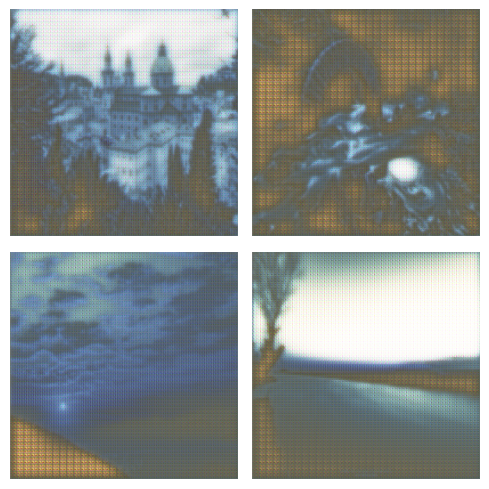

Step 1/18, Epoch 9/25 - Discriminator Loss: 0.8665785789489746, Accuracy: 79.88% - Generator Loss: 0.8651599884033203, Accuracy: 79.91%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


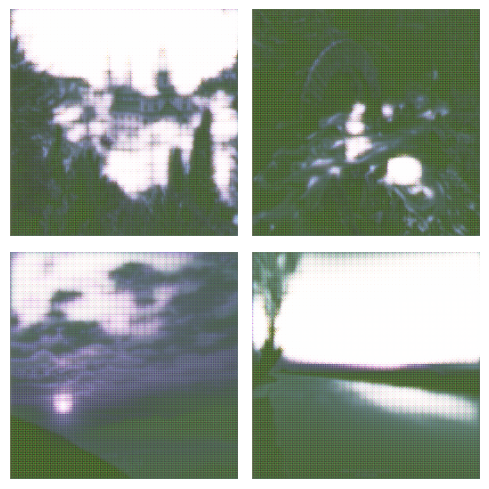

Step 1/18, Epoch 10/25 - Discriminator Loss: 0.7922221422195435, Accuracy: 81.41% - Generator Loss: 0.7912424206733704, Accuracy: 81.44%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


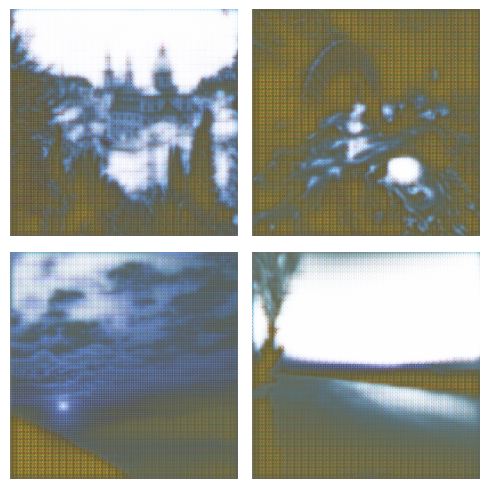

Step 1/18, Epoch 11/25 - Discriminator Loss: 0.7452100515365601, Accuracy: 81.95% - Generator Loss: 0.7442401051521301, Accuracy: 81.98%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


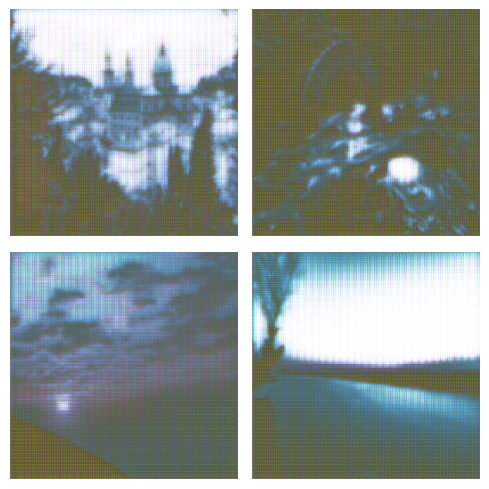

Step 1/18, Epoch 12/25 - Discriminator Loss: 0.6938536763191223, Accuracy: 82.83% - Generator Loss: 0.6929808855056763, Accuracy: 82.85%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


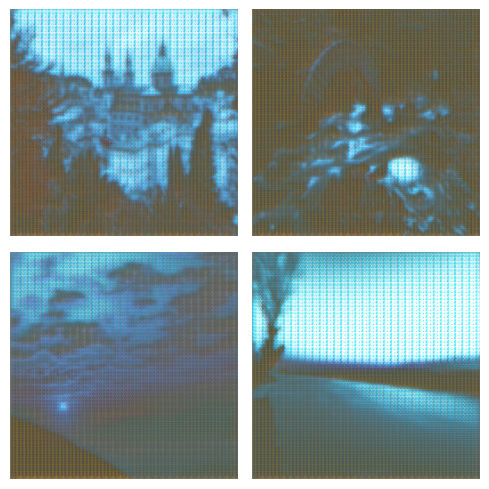

Step 1/18, Epoch 13/25 - Discriminator Loss: 0.649519145488739, Accuracy: 83.91% - Generator Loss: 0.648996889591217, Accuracy: 83.93%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


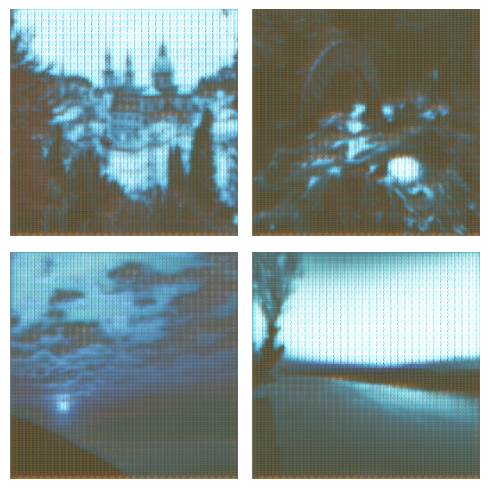

Step 1/18, Epoch 14/25 - Discriminator Loss: 0.6811933517456055, Accuracy: 83.79% - Generator Loss: 0.681007981300354, Accuracy: 83.78%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


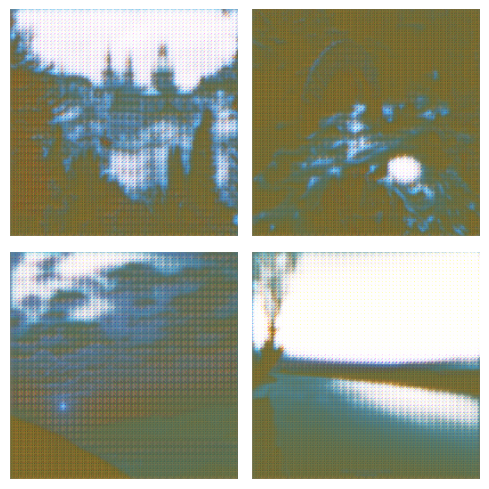

In [ ]:
# GAN model to combine both the generator and discriminator
gan_model = Sequential([
    generator_model,
    discriminator_model
])

# Compile the GAN model
gan_model.compile(loss='binary_crossentropy', optimizer=Adam(0.001, 0.5))

# Helper function to plot the training history
def plot_training_history(discriminator_history, generator_history):
    # Unpacking the loss and accuracy for both discriminator and generator
    d_loss, d_accuracy = zip(*discriminator_history)
    g_loss, g_accuracy = zip(*generator_history)

    epochs = range(1, len(d_loss) + 1)

    # Creating subplots
    fig, ax = plt.subplots(2, 1, figsize=(10, 10))

    # Plotting Discriminator Loss and Accuracy
    ax[0].plot(epochs, d_loss, 'bo-', label='Discriminator Loss')
    ax[0].plot(epochs, d_accuracy, 'ro-', label='Discriminator Accuracy')
    ax[0].set_title('Discriminator Loss and Accuracy')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss/Accuracy')
    ax[0].legend()

    # Plotting Generator Loss and Accuracy
    ax[1].plot(epochs, g_loss, 'bo-', label='Generator Loss')
    ax[1].plot(epochs, g_accuracy, 'ro-', label='Generator Accuracy')
    ax[1].set_title('Generator Loss and Accuracy')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Loss/Accuracy')
    ax[1].legend()

    # Displaying the plot
    plt.tight_layout()
    plt.show()

# Helper function to display images
def show_imgs(generator_model, real_photos):
    transformed_images = generator_model.predict(real_photos)  # Transform photos

    # Calculate number of rows and columns to display
    num_images = transformed_images.shape[0]
    num_cols = int(np.sqrt(num_images))
    num_rows = num_cols

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(5, 5))
    cnt = 0
    for i in range(num_rows):
        for j in range(num_cols):
            if cnt < num_images:
                axs[i, j].imshow((transformed_images[cnt] * 0.5 + 0.5))  # Rescale images
                axs[i, j].axis('off')
                cnt += 1
    plt.tight_layout()
    plt.show()
    plt.close()

def train_gan(generator_model, discriminator_model, gan_model, photo_ds, monet_ds, epochs, batch_size):
    # Generate real and fake labels for training
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    # Lists to hold training history
    discriminator_losses = []
    generator_losses = []

    total_photos = len(list(photo_ds))
    total_monets = len(list(monet_ds))
    steps_per_epoch = min(total_photos, total_monets) // batch_size

    for epoch in range(epochs):
        # Get next batch of images
        photo_iter = iter(photo_ds.repeat())
        monet_iter = iter(monet_ds.repeat())

        # Iterate through the images
        for i in range(steps_per_epoch):
            # Retrieve next batch of images for training
            real_photos = next(photo_iter)
            real_monets = next(monet_iter)

            # Generate fake Monet images from real photos
            fake_monets = generator_model.predict(real_photos, verbose=0)

            # Train the discriminator on real and fake images
            discriminator_model.trainable = True
            d_loss_real = discriminator_model.train_on_batch(real_monets, real)
            d_loss_fake = discriminator_model.train_on_batch(fake_monets, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake) # avg loss for discriminator between the real and generated monets
            discriminator_losses.append(d_loss)

            # Train the generator
            discriminator_model.trainable = False
            g_loss = gan_model.train_on_batch(real_photos, real)
            generator_losses.append(g_loss[1:])

            # Show training progress and generated image
            if (i) % 25 == 0:  # Adjust frequency as needed
                print(f"Step {i+1}/{steps_per_epoch}, Epoch {epoch+1}/{epochs} - Discriminator Loss: {d_loss[0]}, Accuracy: {round(100 * d_loss[1], 2)}% - Generator Loss: {g_loss[1]}, Accuracy: {round(100 * g_loss[2], 2)}%")
                real_photos = next(iter(photo_ds.take(1)))  # Take a batch for display
                show_imgs(generator_model, real_photos)

    return discriminator_losses, generator_losses

discriminator_losses, generator_losses = train_gan(generator_model, discriminator_model, gan_model, photo_ds, monet_ds, epochs=25, batch_size=4)
plot_training_history(discriminator_losses, generator_losses)